In [43]:
#Importing Libraries

In [2]:
import numpy as np
import pickle as pkl
import tensorflow as tf
from tensorflow.keras.applications.resnet50 import ResNet50,preprocess_input
from tensorflow.keras.preprocessing import image
from tensorflow.keras.layers import GlobalMaxPool2D

from sklearn.neighbors import NearestNeighbors
import os
from numpy.linalg import norm

In [45]:
#Extract Filenames from Folder

In [4]:
filenames = []
for file in os.listdir('C:/Users/bhalg/OneDrive/Desktop/Aurel/archive/fashion-dataset/images'):
    filenames.append(os.path.join('C:/Users/bhalg/OneDrive/Desktop/Aurel/archive/fashion-dataset/images',file))
    

In [5]:
len(filenames)

44441

In [7]:
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.layers import GlobalMaxPool2D, Input
from tensorflow.keras.models import Model

# Define the input shape
input_tensor = Input(shape=(224, 224, 3))

# Load the ResNet50 model without the top layer
base_model = ResNet50(weights='imagenet', include_top=False)
base_model.trainable = False  # Freeze the base model

# Pass the input tensor through the base model
base_model_output = base_model(input_tensor)

# Add the pooling layer
pooling_layer = GlobalMaxPool2D()(base_model_output)

# Create the model
model = Model(inputs=input_tensor, outputs=pooling_layer)

# Print the summary of the model
model.summary()



Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ resnet50 (Functional)           │ (None, 7, 7, 2048)     │    23,587,712 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_max_pooling2d            │ (None, 2048)           │             0 │
│ (GlobalMaxPooling2D)            │                        │               │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 23,587,712 (89.98 MB)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 23,587,712 (89.98 MB)

In [50]:
#Extracting Fetaures from Image

In [8]:
img = image.load_img('C:/Users/bhalg/OneDrive/Desktop/Aurel/archive/fashion-dataset/images/59635.jpg', target_size=(224,224))
img_array = image.img_to_array(img)
img_expand_dim = np.expand_dims(img_array, axis=0)
img_preprocess = preprocess_input(img_expand_dim)
result = model.predict(img_preprocess).flatten()
norm_result = result/norm(result)
norm_result

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


array([0.00835589, 0.01895686, 0.00361406, ..., 0.        , 0.03085558,
       0.        ], dtype=float32)

In [9]:
def extract_features_from_images(image_path, model):
    img = image.load_img(image_path, target_size=(224,224))
    img_array = image.img_to_array(img)
    img_expand_dim = np.expand_dims(img_array, axis=0)
    img_preprocess = preprocess_input(img_expand_dim)
    result = model.predict(img_preprocess).flatten()
    norm_result = result/norm(result)
    return norm_result

In [10]:
extract_features_from_images(filenames[0], model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


array([0.01886863, 0.01673292, 0.00399705, ..., 0.00810947, 0.01061417,
       0.05708192], dtype=float32)

In [13]:
image_features = []
for file in filenames[0:44441]:
    image_features.append(extract_features_from_images(file, model))
    print("No :" ,file)
image_features

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
No : C:/Users/bhalg/OneDrive/Desktop/Aurel/archive/fashion-dataset/images\10000.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
No : C:/Users/bhalg/OneDrive/Desktop/Aurel/archive/fashion-dataset/images\10001.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
No : C:/Users/bhalg/OneDrive/Desktop/Aurel/archive/fashion-dataset/images\10002.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
No : C:/Users/bhalg/OneDrive/Desktop/Aurel/archive/fashion-dataset/images\10003.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
No : C:/Users/bhalg/OneDrive/Desktop/Aurel/archive/fashion-dataset/images\10004.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
No : C:/Users/bhalg/OneDrive/Desktop/Aurel/archive/fashion-dataset/images\10005.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
No : C:/Users/bhalg/OneDrive/Desktop/Aurel/archive/fashion-dataset/images\10006.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
No : C:/Users/bhalg/OneDrive/Desktop/Aurel/archive/fashion-dataset/images\10007.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━

[array([0.01886863, 0.01673292, 0.00399705, ..., 0.00810947, 0.01061417,
        0.05708192], dtype=float32),
 array([0.        , 0.02039725, 0.        , ..., 0.        , 0.        ,
        0.04172787], dtype=float32),
 array([0.00059417, 0.0341487 , 0.01400362, ..., 0.        , 0.        ,
        0.02302489], dtype=float32),
 array([0.01809277, 0.06029456, 0.00208149, ..., 0.01785664, 0.02855501,
        0.06173439], dtype=float32),
 array([0.02202042, 0.01658257, 0.        , ..., 0.00803617, 0.02135412,
        0.028024  ], dtype=float32),
 array([0.        , 0.11091937, 0.01128501, ..., 0.        , 0.01216776,
        0.02490796], dtype=float32),
 array([0.0092884 , 0.10958569, 0.00514371, ..., 0.00458959, 0.03560189,
        0.03131821], dtype=float32),
 array([0.        , 0.12425718, 0.00651041, ..., 0.        , 0.00952099,
        0.03090204], dtype=float32),
 array([0.00637798, 0.09182654, 0.00335865, ..., 0.00216728, 0.02248881,
        0.03567937], dtype=float32),
 array([0.

In [14]:
Image_features = pkl.dump(image_features, open('Images_features.pkl','wb'))

In [15]:
filenames = pkl.dump(filenames, open('filenames.pkl','wb'))

In [62]:
#Loading Pickle Files

In [16]:
Image_features = pkl.load(open('Images_features.pkl','rb'))

In [17]:
filenames = pkl.load(open('filenames.pkl','rb'))

In [18]:
np.array(Image_features).shape

(44441, 2048)

In [37]:
#Finidng Simialar Images

In [19]:
neighbors = NearestNeighbors(n_neighbors=5, algorithm='brute', metric='euclidean')

In [20]:
neighbors.fit(Image_features)

NearestNeighbors(algorithm='brute', metric='euclidean')

In [21]:
input_image = extract_features_from_images('C:/Users/bhalg/OneDrive/Desktop/Aurel/archive/fashion-dataset/images/59632.jpg',model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


In [22]:
distance,indices = neighbors.kneighbors([input_image])

In [23]:
indices[0]

array([40662, 40634, 32810, 35169, 21061], dtype=int64)

In [24]:
from IPython.display import Image

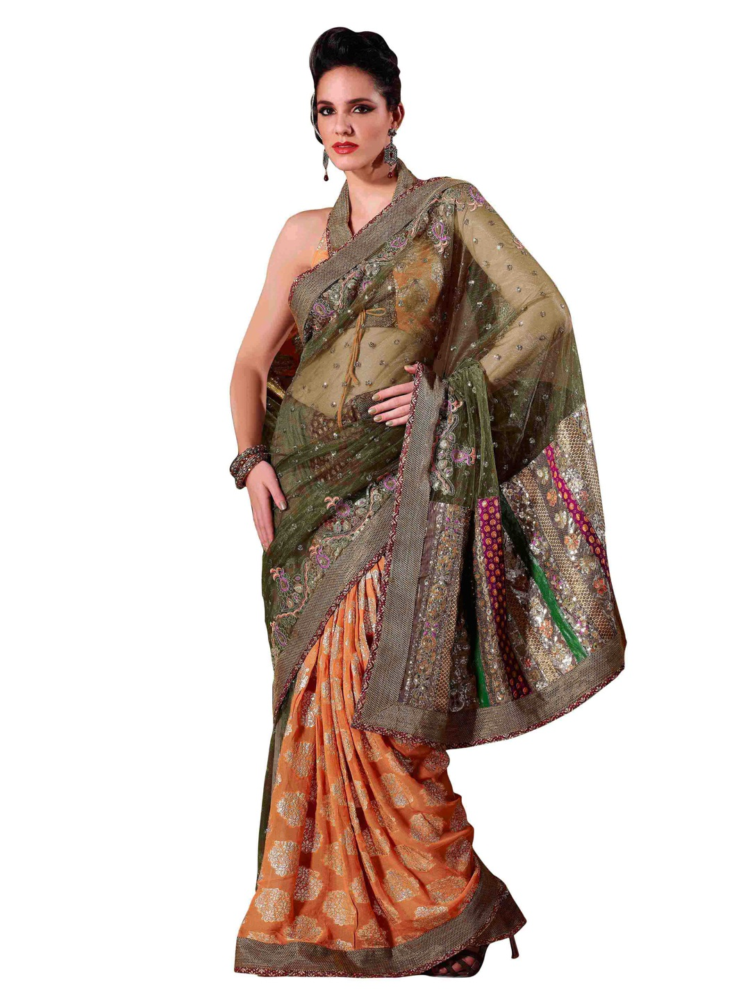

In [26]:
Image('C:/Users/bhalg/OneDrive/Desktop/Aurel/archive/fashion-dataset/images/59632.jpg')

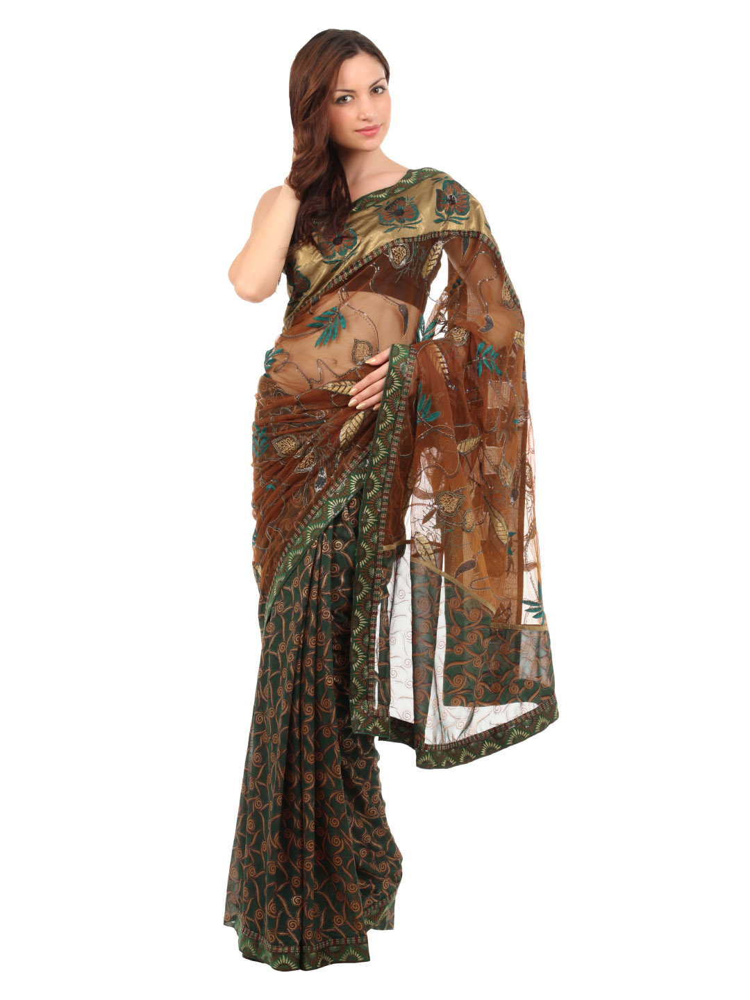

In [27]:
Image(filenames[indices[0][1]])

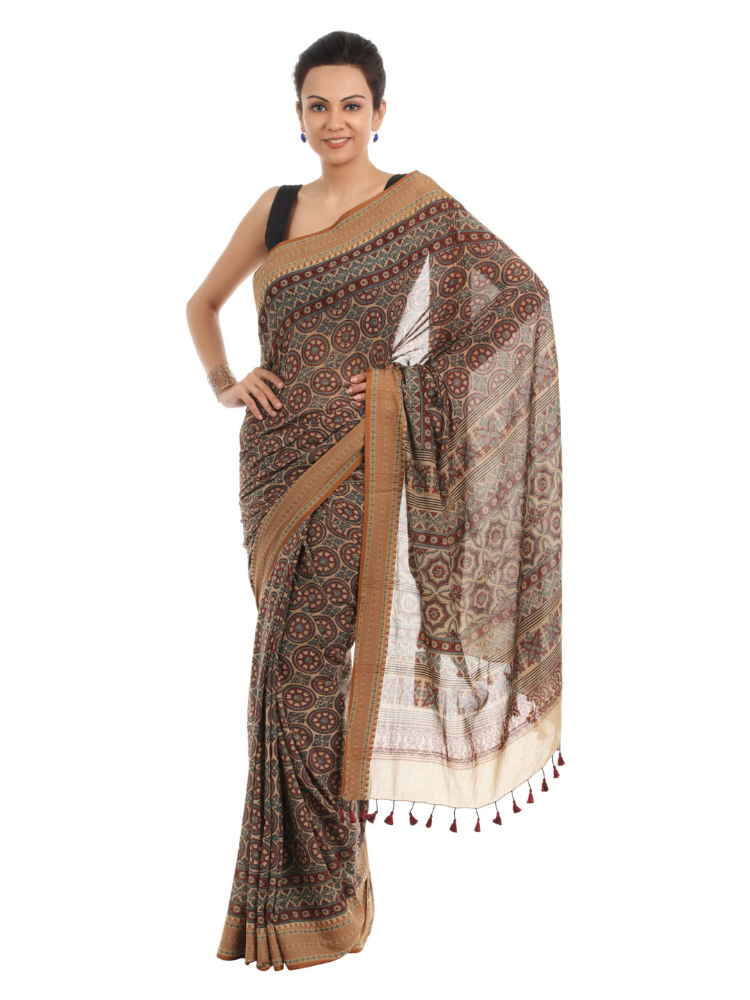

In [28]:
Image(filenames[indices[0][2]])

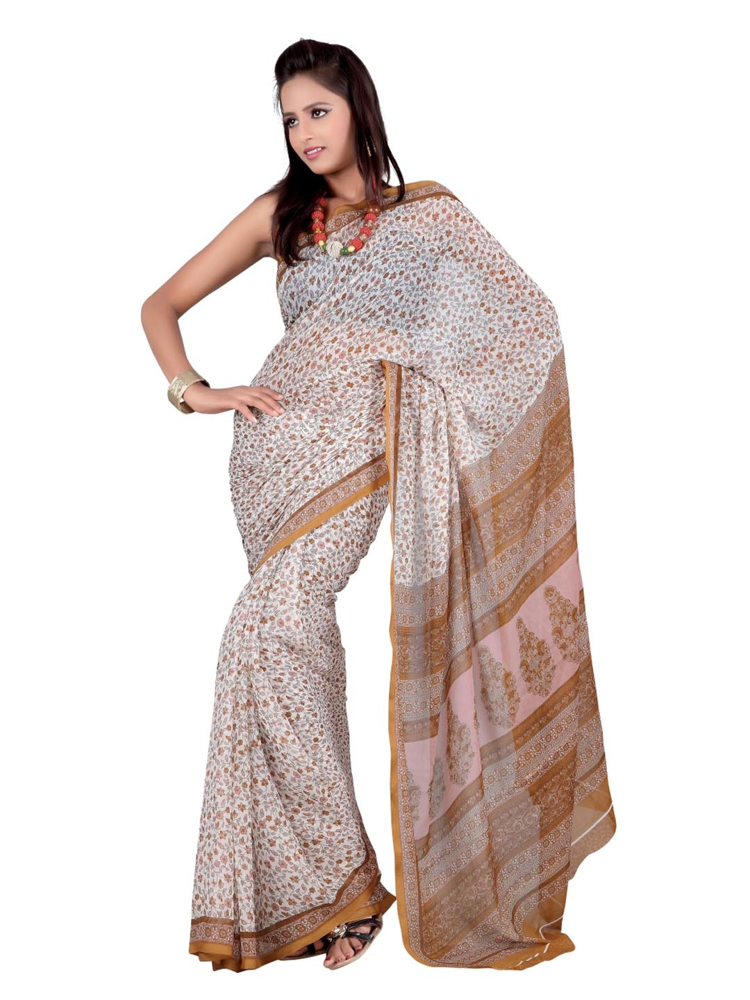

In [29]:
Image(filenames[indices[0][3]])

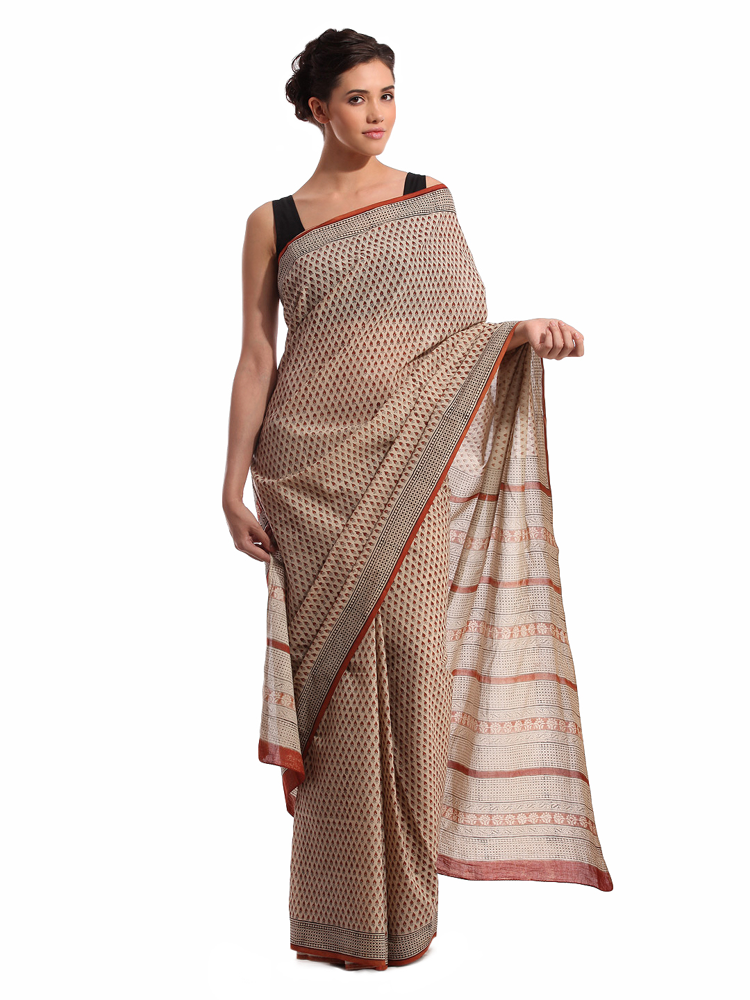

In [30]:
Image(filenames[indices[0][4]])

In [ ]:
from flask import Flask, request, jsonify
import os
import cv2
import numpy as np
import torch
from sklearn.metrics.pairwise import euclidean_distances

# Initialize Flask app
app = Flask(__name__)

# Function to find dominant colors using PyTorch
def find_dominant_color(image, clusters=3, max_iter=100):
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    pixels = image.reshape((-1, 3))
    pixels = pixels[np.all(pixels != [0, 0, 0], axis=1)]  # Remove black pixels
    if len(pixels) == 0:
        return np.array([])

    pixels_tensor = torch.tensor(pixels, dtype=torch.float32)
    if torch.cuda.is_available():
        pixels_tensor = pixels_tensor.cuda()

    centroids = pixels_tensor[torch.randperm(len(pixels_tensor))[:clusters]]

    for _ in range(max_iter):
        distances = torch.cdist(pixels_tensor, centroids)
        labels = torch.argmin(distances, dim=1)
        new_centroids = torch.stack([pixels_tensor[labels == i].mean(0) for i in range(clusters)])
        if torch.allclose(centroids, new_centroids, atol=1e-2):
            break
        centroids = new_centroids

    return centroids.cpu().numpy().astype(int)

# Endpoint for dominant colors
@app.route('/dominant-colors', methods=['POST'])
def dominant_colors():
    if 'image' not in request.files:
        return jsonify({'error': 'No image file provided'}), 400

    # Save and process the uploaded image
    image_file = request.files['image']
    image_path = f"./uploaded_images/{image_file.filename}"
    os.makedirs('./uploaded_images', exist_ok=True)
    image_file.save(image_path)

    image = cv2.imread(image_path)
    if image is None:
        return jsonify({'error': 'Invalid image'}), 400

    # Extract dominant colors
    dominant_colors = find_dominant_color(image)
    os.remove(image_path)  # Clean up

    # Return dominant colors
    return jsonify({
        'dominant_colors': dominant_colors.tolist()
    })

# Additional endpoints can be added here...

# Start the server
if __name__ == '__main__':
    app.run(host='0.0.0.0', port=5000)
